In [1]:
import numpy as np
import matplotlib.pyplot as plt
import librosa
from pathlib import Path
import librosa.display
import soundfile as sf
from scipy import signal
from IPython.display import Audio, display
import warnings
warnings.filterwarnings('ignore')

In [15]:
# 1. ЗАГРУЗКА АУДИО

def load_audio(file_path, target_sr=16000):
    try:
        # Пытаемся загрузить стандартным способом
        audio, sr = librosa.load(file_path, sr=target_sr)
        return audio, sr
    except Exception as e:
        try:
            import audioread
            with audioread.audio_open(file_path) as f:
                audio, sr = librosa.load(file_path, sr=target_sr)
                return audio, sr
        except:
            raise RuntimeError(f"Не удалось прочитать файл {file_path}. Проверьте, установлен ли FFmpeg в системе.")

def load_dataset(folder_path="dataset", target_sr=16000):
    dataset_dir = Path(folder_path)
    
    # Расширения
    supported_extensions = {'.wav', '.mp3', '.ogg', '.flac', '.m4a'}
    
    # {имя_файла: массив_аудио}
    audio_data = {}

    if not dataset_dir.exists() or not dataset_dir.is_dir():
        print(f"Ошибка: Папка '{folder_path}' не найдена")
        return audio_data

    for file_path in dataset_dir.rglob('*.*'):
        if file_path.suffix.lower() in supported_extensions:
            try:
                # ЗЗагрузка
                audio, sr = load_audio(str(file_path), target_sr)
                
                # Сохранение
                audio_data[file_path.name] = {
                    "audio": audio, # звук
                    "sr": sr, # частота дискретизации (16000)
                    "path": str(file_path)
                }
                print(f"Успешно: {file_path.name} (Длина: {len(audio)/sr:.2f} сек)")
                
            except Exception as e:
                print(f"Ошибка при загрузке {file_path.name}: {e}")
    return audio_data

In [16]:
if __name__ == "__main__":

    my_dataset = load_dataset("dataset")
    files = list(my_dataset.keys())
    
    for i, filename in enumerate(files, 1):
        print(f"Файл {i}/{len(files)}: {filename}")
        
        audio = my_dataset[filename]["audio"]
        sr = my_dataset[filename]["sr"]
        duration = len(audio) / sr
        
        print(f"Длительность: {duration:.2f} сек")
        display(Audio(audio, rate=sr))

Успешно: test1_clear.ogg (Длина: 1.91 сек)
Успешно: test1_musicSpeech.wav (Длина: 3.09 сек)
Успешно: test2_speechMore.ogg (Длина: 7.84 сек)
Успешно: test2_speech_and_music.ogg (Длина: 10.71 сек)
Успешно: test2_speech_and_music_2.ogg (Длина: 10.60 сек)
Успешно: test3_musicMore.ogg (Длина: 11.56 сек)
Успешно: test4_MaximMoment.ogg (Длина: 6.41 сек)
Успешно: test_2.m4a (Длина: 10.30 сек)
Файл 1/8: test1_clear.ogg
Длительность: 1.91 сек


Файл 2/8: test1_musicSpeech.wav
Длительность: 3.09 сек


Файл 3/8: test2_speechMore.ogg
Длительность: 7.84 сек


Файл 4/8: test2_speech_and_music.ogg
Длительность: 10.71 сек


Файл 5/8: test2_speech_and_music_2.ogg
Длительность: 10.60 сек


Файл 6/8: test3_musicMore.ogg
Длительность: 11.56 сек


Файл 7/8: test4_MaximMoment.ogg
Длительность: 6.41 сек


Файл 8/8: test_2.m4a
Длительность: 10.30 сек


In [ ]:
# 2. ОЦЕНКА ШУМА
def estimate_noise(audio, frame_length=2048, hop_length=512, percentile=20):
    # Разбиваем на фреймы
    n_frames = 1 + (len(audio) - frame_length) // hop_length
    
    # Быстрое преобразование Фурье для каждого фрейма
    spectrum = []
    for i in range(n_frames):
        start = i * hop_length
        end = start + frame_length
        frame = audio[start:end]
        
        window = np.hanning(frame_length)
        windowed = frame * window
        
        fft = np.fft.rfft(windowed)
        magnitude = np.abs(fft)
        spectrum.append(magnitude)
    
    spectrum = np.array(spectrum)
    
    # Оценка шума по %
    noise_spectrum = np.percentile(spectrum, percentile, axis=0)
    
    return noise_spectrum

# Ручной выбор участка шума
def manual_extract_noise(audio, noise_start_sec=0, noise_duration_sec=1, sr=16000):
    start_sample = int(noise_start_sec * sr)
    end_sample = start_sample + int(noise_duration_sec * sr)
    noise_sample = audio[start_sample:end_sample]
    
    return estimate_noise(noise_sample)

In [ ]:
# 3. СПЕКТРАЛЬНОЕ ВЫЧИТАНИЕ
def spectral_subtraction(audio, noise_spectrum, sr=16000, alpha=2.0, beta=0.01, frame_length=2048, hop_length=512):
    n_frames = 1 + (len(audio) - frame_length) // hop_length
    
    # Инициализация выходного массива и окна
    enhanced = np.zeros(len(audio))
    window = np.hanning(frame_length)
    window_sum = np.zeros(len(audio))
    
    for i in range(n_frames):
        start = i * hop_length
        end = start + frame_length
        
        frame = audio[start:end]
        frame_windowed = frame * window
        
        # БПФ
        fft = np.fft.rfft(frame_windowed)
        magnitude = np.abs(fft)
        phase = np.angle(fft)
        
        # Вычитаем шум с коэффициентом alpha
        magnitude_enhanced = magnitude - alpha * noise_spectrum[:len(magnitude)]
        
        magnitude_enhanced = np.maximum(magnitude_enhanced, beta * magnitude)
        
        fft_enhanced = magnitude_enhanced * np.exp(1j * phase)
        
        frame_enhanced = np.fft.irfft(fft_enhanced)
        
        enhanced[start:end] += frame_enhanced * window
        window_sum[start:end] += window
    
    enhanced = enhanced / np.maximum(window_sum, 1e-10)
    
    return enhanced

In [19]:
# 4. АДАПТИВНОЕ ВЫЧИТАНИЕ
def spectral_subtraction_adaptive(audio, noise_spectrum, sr=16000,
                                  frame_length=2048, hop_length=512):
    n_frames = 1 + (len(audio) - frame_length) // hop_length
    
    enhanced = np.zeros(len(audio))
    window = np.hanning(frame_length)
    window_sum = np.zeros(len(audio))
    
    # ПАРАМЕТРЫ
    alpha_max = 5.0 # Максимальный коэффициент вычитания 
    alpha_min = 1.0 # Минимальный коэффициент вычитания 
    beta = 0.01
    
    for i in range(n_frames):
        start = i * hop_length
        end = start + frame_length
        
        frame = audio[start:end] * window
        fft = np.fft.rfft(frame)
        mag = np.abs(fft)
        phase = np.angle(fft)
        
        frame_power = np.sum(mag**2)
        noise_power = np.sum(noise_spectrum[:len(mag)]**2)
        
        if noise_power > 0:
            snr = 10 * np.log10(frame_power / noise_power)
        else:
            snr = 20
        
        alpha = np.clip(alpha_max - (alpha_max - alpha_min) * (snr + 10) / 20, 
                       alpha_min, alpha_max)
        
        mag_enh = mag - alpha * noise_spectrum[:len(mag)]
        mag_enh = np.maximum(mag_enh, beta * mag)
        
        fft_enh = mag_enh * np.exp(1j * phase)
        frame_enh = np.fft.irfft(fft_enh) * window
        
        enhanced[start:end] += frame_enh
        window_sum[start:end] += window
    
    return enhanced / np.maximum(window_sum, 1e-10)

In [ ]:
# 5. ВИЗУАЛ
def plot_comparison(original, enhanced, sr, title="Результат спектрального вычитания"):
    fig, axes = plt.subplots(2, 2, figsize=(14, 8))
    
    time = np.arange(len(original)) / sr
    
    axes[0, 0].plot(time, original, color='red', alpha=0.7, linewidth=0.5)
    axes[0, 0].set_title('Оригинал (речь + шум)', fontsize=12)
    axes[0, 0].set_xlabel('Время (с)')
    axes[0, 0].set_ylabel('Амплитуда')
    axes[0, 0].set_xlim([0, min(5, len(original)/sr)])
    
    axes[0, 1].plot(time, enhanced, color='blue', alpha=0.7, linewidth=0.5)
    axes[0, 1].set_title('Очищенная речь', fontsize=12)
    axes[0, 1].set_xlabel('Время (с)')
    axes[0, 1].set_ylabel('Амплитуда')
    axes[0, 1].set_xlim([0, min(5, len(original)/sr)])
    
    D_orig = librosa.amplitude_to_db(np.abs(librosa.stft(original)), ref=np.max)
    img1 = librosa.display.specshow(D_orig, sr=sr, x_axis='time', y_axis='hz', ax=axes[1, 0], cmap='viridis')
    axes[1, 0].set_title('Спектрограмма оригинала', fontsize=12)
    fig.colorbar(img1, ax=axes[1, 0], format='%+2.0f dB')
    
    D_enh = librosa.amplitude_to_db(np.abs(librosa.stft(enhanced)), ref=np.max)
    img2 = librosa.display.specshow(D_enh, sr=sr, x_axis='time', y_axis='hz', ax=axes[1, 1], cmap='viridis')
    axes[1, 1].set_title('Спектрограмма очищенного сигнала', fontsize=12)
    fig.colorbar(img2, ax=axes[1, 1], format='%+2.0f dB')
    
    plt.tight_layout()
    plt.show()

"\ndef objective_metrics(clean, enhanced, sr):\n    noise = clean - enhanced\n    snr = 10 * np.log10(np.sum(clean**2) / np.sum(noise**2))\n\n    # PESQ (требуется библиотека pesq)\n    try:\n        from pesq import pesq\n        pesq_score = pesq(sr, clean, enhanced, 'wb')\n    except:\n        pesq_score = None\n\n    # STOI (Short-Time Objective Intelligibility)\n    try:\n        from pystoi import stoi\n        stoi_score = stoi(clean, enhanced, sr, extended=False)\n    except:\n        stoi_score = None\n\n    return {\n        'SNR (dB)': snr,\n        'PESQ': pesq_score,\n        'STOI': stoi_score\n    }"

In [ ]:
# 6. TEST

def process_audio_file(input_file, output_file='enhanced_speech.wav',noise_start_sec=0 ,noise_duration_sec=0.5, adaptive=True):

    print(f"Загрузка файла: {input_file}")
    audio_mixed, sr = load_audio(input_file)
    
    print(f"Частота дискретизации: {sr} Гц")
    print(f"Длительность: {len(audio_mixed)/sr:.2f} сек")
    
    print("\nОценка шума...")
    if noise_duration_sec > 0:
        noise_spectrum = manual_extract_noise(audio_mixed, noise_start_sec,noise_duration_sec, sr)
        print(f"Шум оценен по участку {noise_start_sec}-{noise_start_sec+noise_duration_sec} сек")
    else:
        noise_spectrum = estimate_noise(audio_mixed, percentile=40) #ПАРАМЕТР
    
    print("Применение спектрального вычитания...")
    
    if adaptive:
        enhanced = spectral_subtraction_adaptive(audio_mixed, noise_spectrum, sr)
        print("Использован адаптивный алгоритм (Berouti)")
    else:
        enhanced = spectral_subtraction(audio_mixed, noise_spectrum, sr, 
                                       alpha=8.0, beta=0.01) #ПАРАМЕТР
        print("Использован базовый алгоритм")
    
    max_val = np.max(np.abs(enhanced))
    if max_val > 0:
        enhanced = enhanced / max_val * 0.95
    
    sf.write(output_file, enhanced, sr)
    print(f"\nРезультат сохранен в: {output_file}")
    
    return audio_mixed, enhanced, sr

In [ ]:
def process_and_visualize_all(dataset_folder="dataset", output_folder="cleaned_results", noise_start_sec=0.0, noise_duration_sec=2.0, adaptive=False, show_plots=True, play_audio=True):

    output_dir = Path(output_folder)
    output_dir.mkdir(exist_ok=True)
    
    # Загружаем все файлы
    print("="*60)
    audio_data = load_dataset(dataset_folder)
    
    if not audio_data:
        print("Нет файлов для обработки!")
        return {}
    
    results = {}
    
    print("\n" + "="*60)
    
    for idx, (filename, data) in enumerate(audio_data.items(), 1):
        print(f"\n{'='*60}")
        print(f"📁 Файл {idx}/{len(audio_data)}: {filename}")
        print(f"{'='*60}")
        
        input_path = data["path"]
        output_filename = f"cleaned_{Path(filename).stem}.wav"
        output_path = output_dir / output_filename
        
        try:
            # Обрабатываем файл
            original, cleaned, sample_rate = process_audio_file(
                input_file=input_path,
                output_file=str(output_path),
                noise_start_sec=noise_start_sec,
                noise_duration_sec=noise_duration_sec,
                adaptive=adaptive
            )
            
            # Сохраняем результат
            results[filename] = {
                "original": original,
                "cleaned": cleaned,
                "sr": sample_rate,
                "output_path": str(output_path)
            }
            
            # Визуализация
            if show_plots:
                print("\nВизуализация:")
                try:
                    plot_comparison(original[:int(5*sample_rate)], 
                                  cleaned[:int(5*sample_rate)], 
                                  sample_rate)
                except Exception as e:
                    print(f"  Ошибка визуализации: {e}")
            
            if play_audio:
                print("\nПрослушивание:")
                print("Оригинал:")
                display(Audio(original, rate=sample_rate))
                print("Очищенный:")
                display(Audio(cleaned, rate=sample_rate))
            
            print(f"\nСохранено: {output_path}")
            
        except Exception as e:
            print(f"Ошибка при обработке {filename}: {e}")
            import traceback
            traceback.print_exc()
    
    return results

Успешно: test1_clear.ogg (Длина: 1.91 сек)
Успешно: test1_musicSpeech.wav (Длина: 3.09 сек)
Успешно: test2_speechMore.ogg (Длина: 7.84 сек)


Успешно: test2_speech_and_music.ogg (Длина: 10.71 сек)
Успешно: test2_speech_and_music_2.ogg (Длина: 10.60 сек)
Успешно: test3_musicMore.ogg (Длина: 11.56 сек)
Успешно: test4_MaximMoment.ogg (Длина: 6.41 сек)
Успешно: test_2.m4a (Длина: 10.30 сек)


📁 Файл 1/8: test1_clear.ogg
Загрузка файла: dataset\test1_clear.ogg
Частота дискретизации: 16000 Гц
Длительность: 1.91 сек

Оценка шума...
  Шум оценен автоматически (перцентиль 40%)
Применение спектрального вычитания...
  Использован базовый алгоритм

Результат сохранен в: cleaned_results\cleaned_test1_clear.wav

Визуализация:


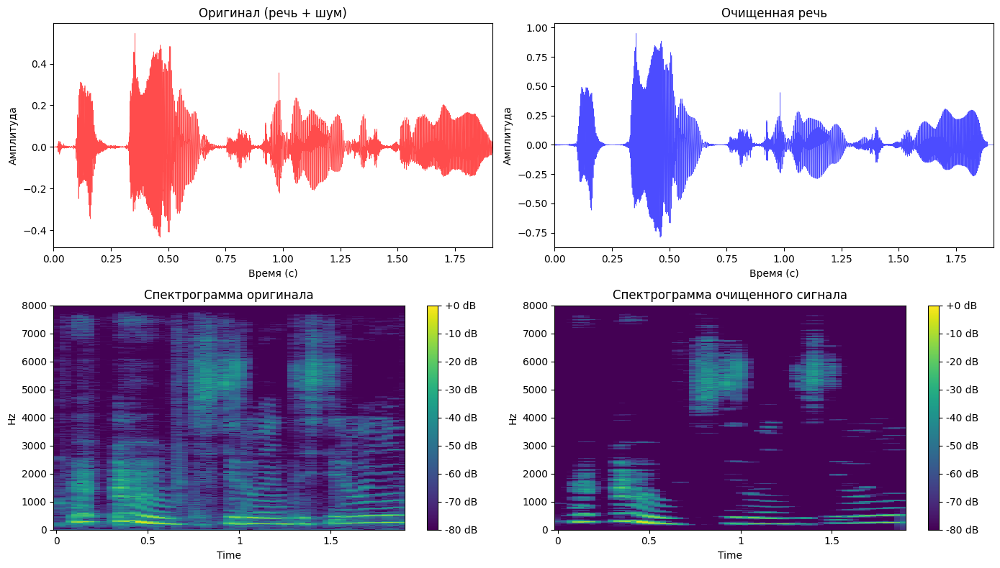


Прослушивание:
Оригинал:


Очищенный:



Сохранено: cleaned_results\cleaned_test1_clear.wav

📁 Файл 2/8: test1_musicSpeech.wav
Загрузка файла: dataset\test1_musicSpeech.wav
Частота дискретизации: 16000 Гц
Длительность: 3.09 сек

Оценка шума...
  Шум оценен автоматически (перцентиль 40%)
Применение спектрального вычитания...
  Использован базовый алгоритм

Результат сохранен в: cleaned_results\cleaned_test1_musicSpeech.wav

Визуализация:


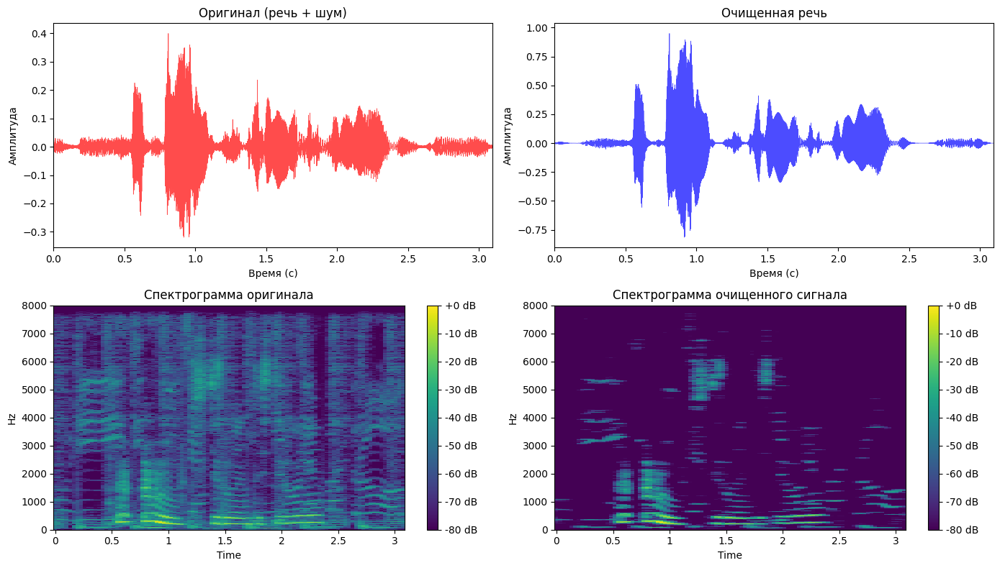


Прослушивание:
Оригинал:


Очищенный:



Сохранено: cleaned_results\cleaned_test1_musicSpeech.wav

📁 Файл 3/8: test2_speechMore.ogg
Загрузка файла: dataset\test2_speechMore.ogg
Частота дискретизации: 16000 Гц
Длительность: 7.84 сек

Оценка шума...
  Шум оценен автоматически (перцентиль 40%)
Применение спектрального вычитания...
  Использован базовый алгоритм

Результат сохранен в: cleaned_results\cleaned_test2_speechMore.wav

Визуализация:


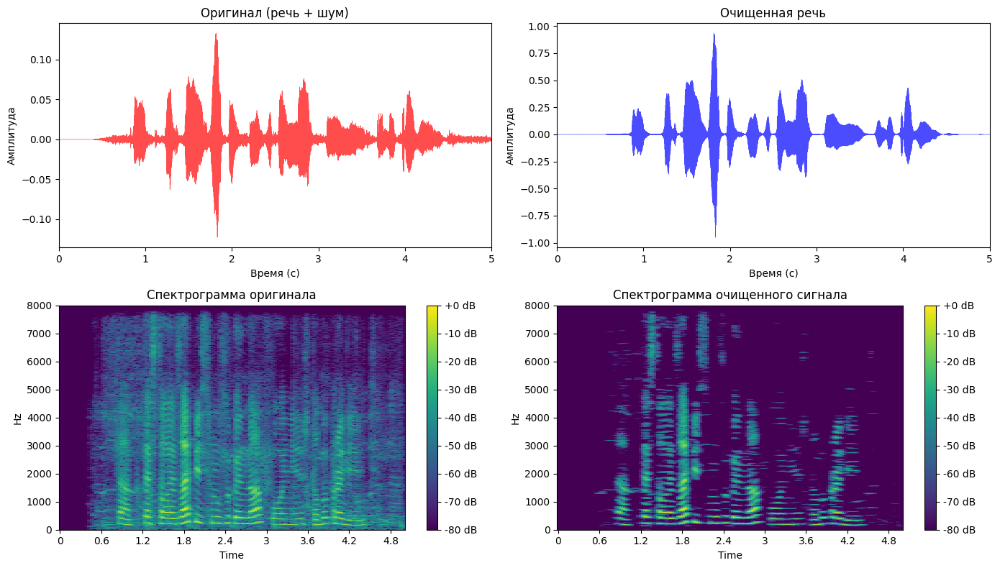


Прослушивание:
Оригинал:


Очищенный:



Сохранено: cleaned_results\cleaned_test2_speechMore.wav

📁 Файл 4/8: test2_speech_and_music.ogg
Загрузка файла: dataset\test2_speech_and_music.ogg
Частота дискретизации: 16000 Гц
Длительность: 10.71 сек

Оценка шума...
  Шум оценен автоматически (перцентиль 40%)
Применение спектрального вычитания...
  Использован базовый алгоритм

Результат сохранен в: cleaned_results\cleaned_test2_speech_and_music.wav

Визуализация:


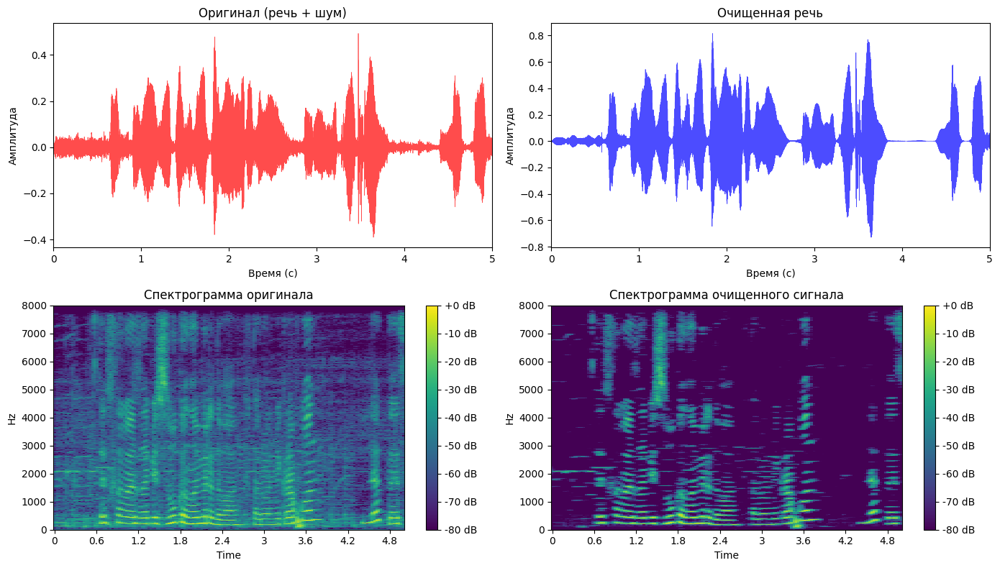


Прослушивание:
Оригинал:


Очищенный:



Сохранено: cleaned_results\cleaned_test2_speech_and_music.wav

📁 Файл 5/8: test2_speech_and_music_2.ogg
Загрузка файла: dataset\test2_speech_and_music_2.ogg
Частота дискретизации: 16000 Гц
Длительность: 10.60 сек

Оценка шума...
  Шум оценен автоматически (перцентиль 40%)
Применение спектрального вычитания...
  Использован базовый алгоритм

Результат сохранен в: cleaned_results\cleaned_test2_speech_and_music_2.wav

Визуализация:


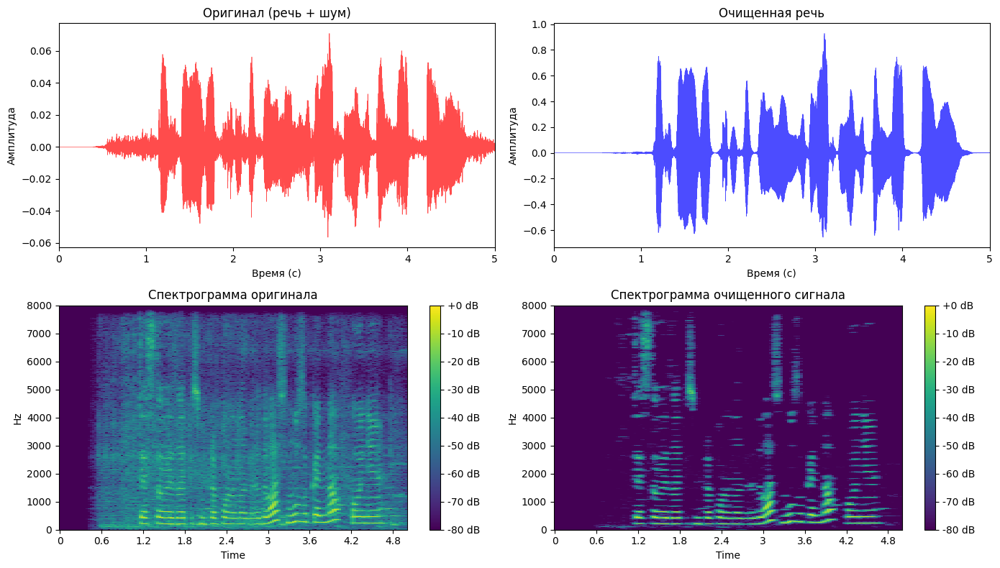


Прослушивание:
Оригинал:


Очищенный:



Сохранено: cleaned_results\cleaned_test2_speech_and_music_2.wav

📁 Файл 6/8: test3_musicMore.ogg
Загрузка файла: dataset\test3_musicMore.ogg
Частота дискретизации: 16000 Гц
Длительность: 11.56 сек

Оценка шума...
  Шум оценен автоматически (перцентиль 40%)
Применение спектрального вычитания...
  Использован базовый алгоритм

Результат сохранен в: cleaned_results\cleaned_test3_musicMore.wav

Визуализация:


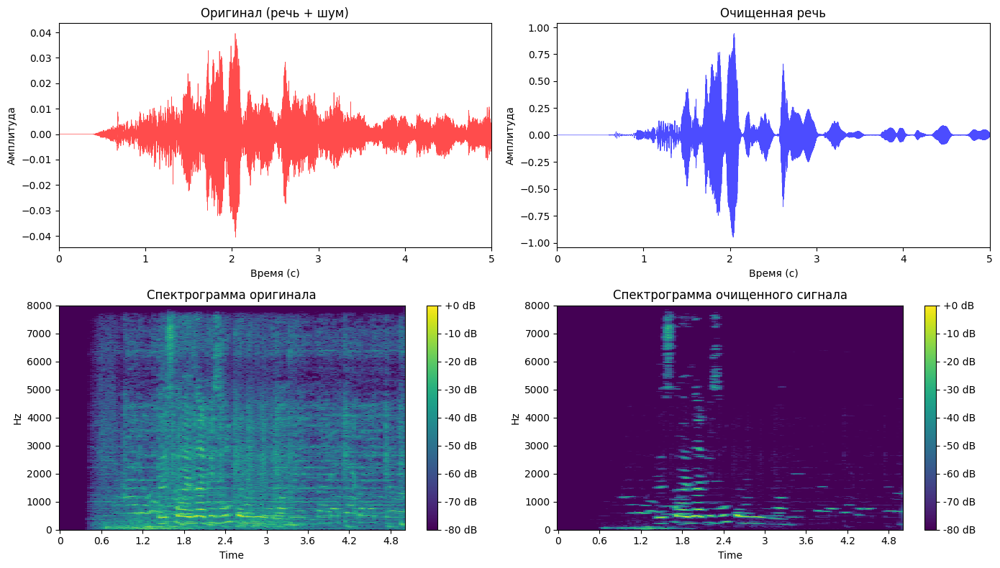


Прослушивание:
Оригинал:


Очищенный:



Сохранено: cleaned_results\cleaned_test3_musicMore.wav

📁 Файл 7/8: test4_MaximMoment.ogg
Загрузка файла: dataset\test4_MaximMoment.ogg
Частота дискретизации: 16000 Гц
Длительность: 6.41 сек

Оценка шума...
  Шум оценен автоматически (перцентиль 40%)
Применение спектрального вычитания...
  Использован базовый алгоритм

Результат сохранен в: cleaned_results\cleaned_test4_MaximMoment.wav

Визуализация:


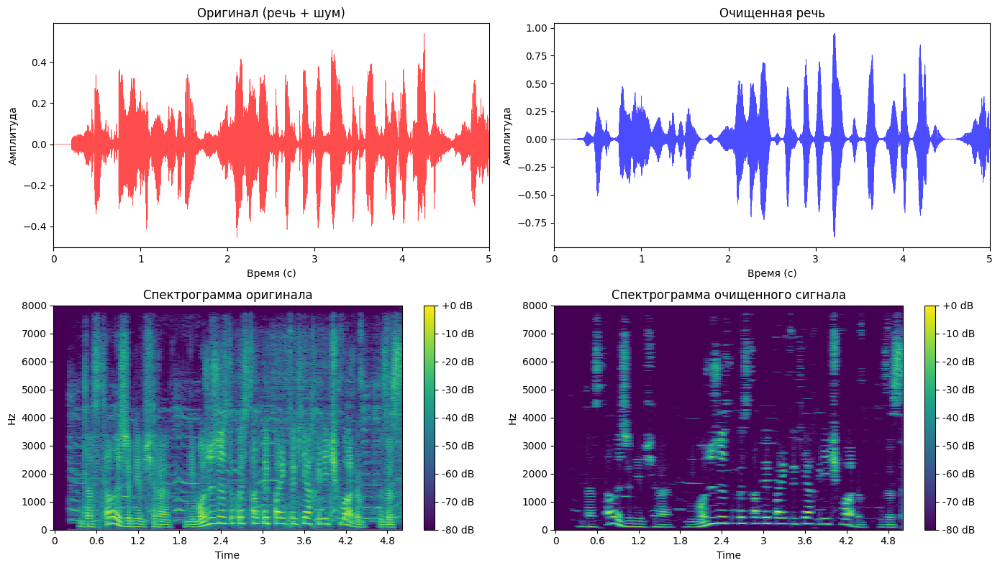


Прослушивание:
Оригинал:


Очищенный:



Сохранено: cleaned_results\cleaned_test4_MaximMoment.wav

📁 Файл 8/8: test_2.m4a
Загрузка файла: dataset\test_2.m4a
Частота дискретизации: 16000 Гц
Длительность: 10.30 сек

Оценка шума...
  Шум оценен автоматически (перцентиль 40%)
Применение спектрального вычитания...
  Использован базовый алгоритм

Результат сохранен в: cleaned_results\cleaned_test_2.wav

Визуализация:


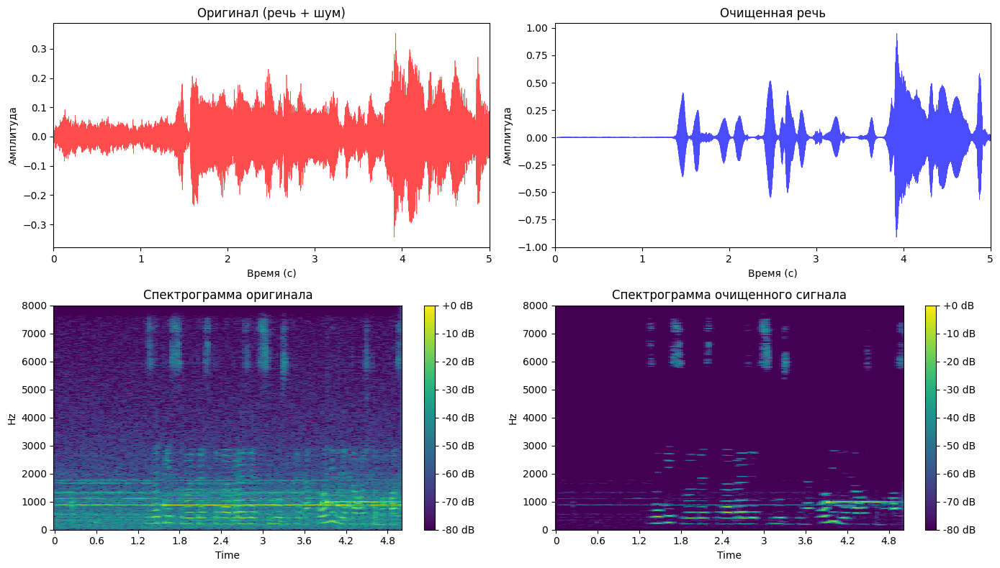


Прослушивание:
Оригинал:


Очищенный:



Сохранено: cleaned_results\cleaned_test_2.wav


In [ ]:
if __name__ == "__main__":
    results = process_and_visualize_all(
        dataset_folder="dataset",
        output_folder="cleaned_results",
        noise_start_sec=0.0,
        noise_duration_sec=0.0,# 0 = автоматическая оценка шума
        adaptive=False, # True - адаптивный, False - базовый
        show_plots=True,
        play_audio=True
    )